In [1]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, InputLayer
from keras.optimizers import Adam
from keras.regularizers import L2
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from keras.callbacks import EarlyStopping

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
import missingno as msno


print(f'tf_version: {tf.__version__}')

2023-09-26 01:43:40.200331: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-26 01:43:41.139120: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-26 01:43:41.140917: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-26 01:43:44.968463: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


tf_version: 2.13.0


In [2]:
# Loading the dataset
original_df = pd.read_csv('./data/CalifornianHousing.csv', sep=',')
df = original_df.copy()
display(df.head())

target = 'median_house_value' 
features = [i for i in df.columns if i not in target]

display(df.describe().transpose())

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


,count,mean,std,min,25%,50%,75%,max
longitude,20640.0,-119.569704,2.003532,-124.3500,-121.8000,-118.4900,-118.01000,-114.3100
latitude,20640.0,35.631861,2.135952,32.5400,33.9300,34.2600,37.71000,41.9500
housing_median_age,20640.0,28.639486,12.585558,1.0000,18.0000,29.0000,37.00000,52.0000
total_rooms,20640.0,2635.763081,2181.615252,2.0000,1447.7500,2127.0000,3148.00000,39320.0000
total_bedrooms,20433.0,537.870553,421.385070,1.0000,296.0000,435.0000,647.00000,6445.0000
population,20640.0,1425.476744,1132.462122,3.0000,787.0000,1166.0000,1725.00000,35682.0000
households,20640.0,499.539680,382.329753,1.0000,280.0000,409.0000,605.00000,6082.0000
median_income,20640.0,3.870671,1.899822,0.4999,2.5634,3.5348,4.74325,15.0001
median_house_value,20640.0,206855.816909,115395.615874,14999.0000,119600.0000,179700.0000,264725.00000,500001.0000


### Missing Values and Duplicates

,Number of Missing Values,% Missing
longitude,0,0.000000
latitude,0,0.000000
housing_median_age,0,0.000000
total_rooms,0,0.000000
total_bedrooms,207,1.002907
population,0,0.000000
households,0,0.000000
median_income,0,0.000000
median_house_value,0,0.000000
ocean_proximity,0,0.000000


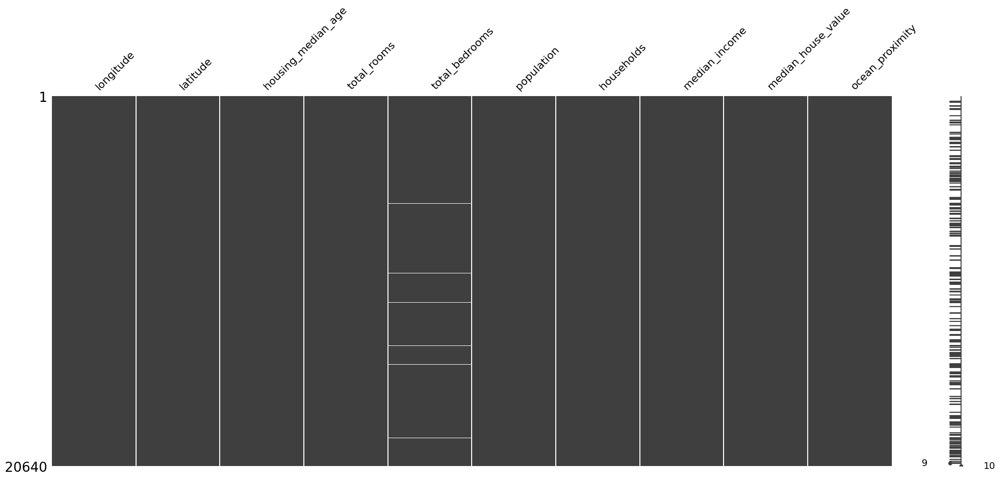

In [3]:
# Checking for missing values
df_nulls = pd.DataFrame(df.isnull().sum(), columns=['Number of Missing Values'])
df_nulls['% Missing'] = df.isnull().sum() * 100 / len(df)
display(df_nulls)

msno.matrix(df) # Plot missing values matrix

#Showing missing data with heatmap before droping 
# plt.figure(figsize=(10,6))
# sns.heatmap(df.isna().transpose());

df.dropna(inplace=True) # Removes rows with less than 9 valid features

In [4]:
print('Number of duplicates: ', df.duplicated().sum())
df.drop_duplicates(inplace=False) # Removes duplicates

Number of duplicates:  0


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


## Exploratory Data Analysis 🔍

### Dispersion Analysis

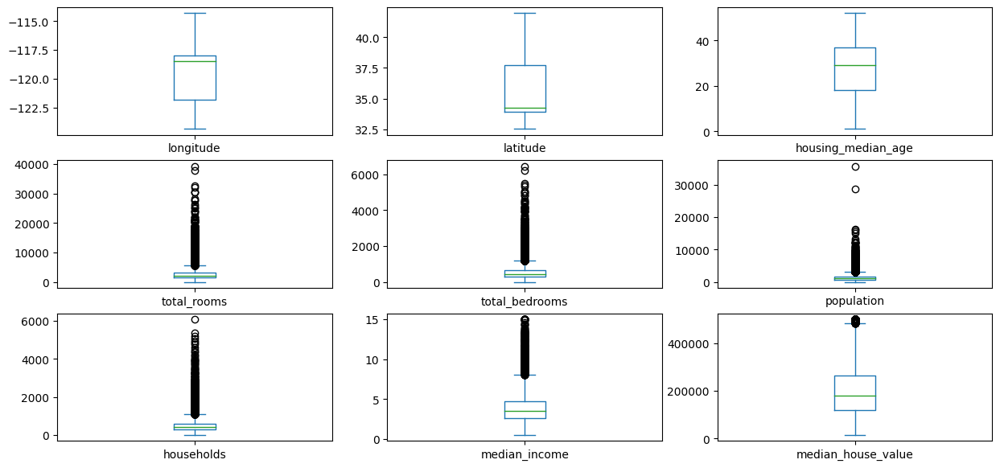

In [53]:
def boxplot_matrix_plotly(df):
    _x = 1
    _y = 1
    _rows = 3
    _cols = 3

    fig = make_subplots(
        rows=_rows, cols=_cols,
        subplot_titles=features)

    for i in features: 
        if _x > _rows: 
            _x = 1
            _y += 1 
        if i == 'ocean_proximity':
            fig.add_trace(go.Box(x=df[i], y=df['median_house_value'], name='median_house_value'),
                        row=_x, col=_y)
        else:
            fig.add_trace(go.Box(y=df[i], name=i),
                        row=_x, col=_y)
        _x += 1

    fig.update_layout(height=800, width=1225,
                    title_text="Multiple Subplots with Titles",
                    showlegend = False)

    fig.update_traces(dict(line=dict(width=1, color="darkslategrey")))

    return fig

fig = boxplot_matrix_plotly(df)
fig.show()

# Pandas boxplot matrix
df.plot(kind='box', subplots=True, layout=(3,3), figsize=(15,7))
plt.show()

/home/matsouto/Code/Py/ML/Supervised Learning/.venv/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



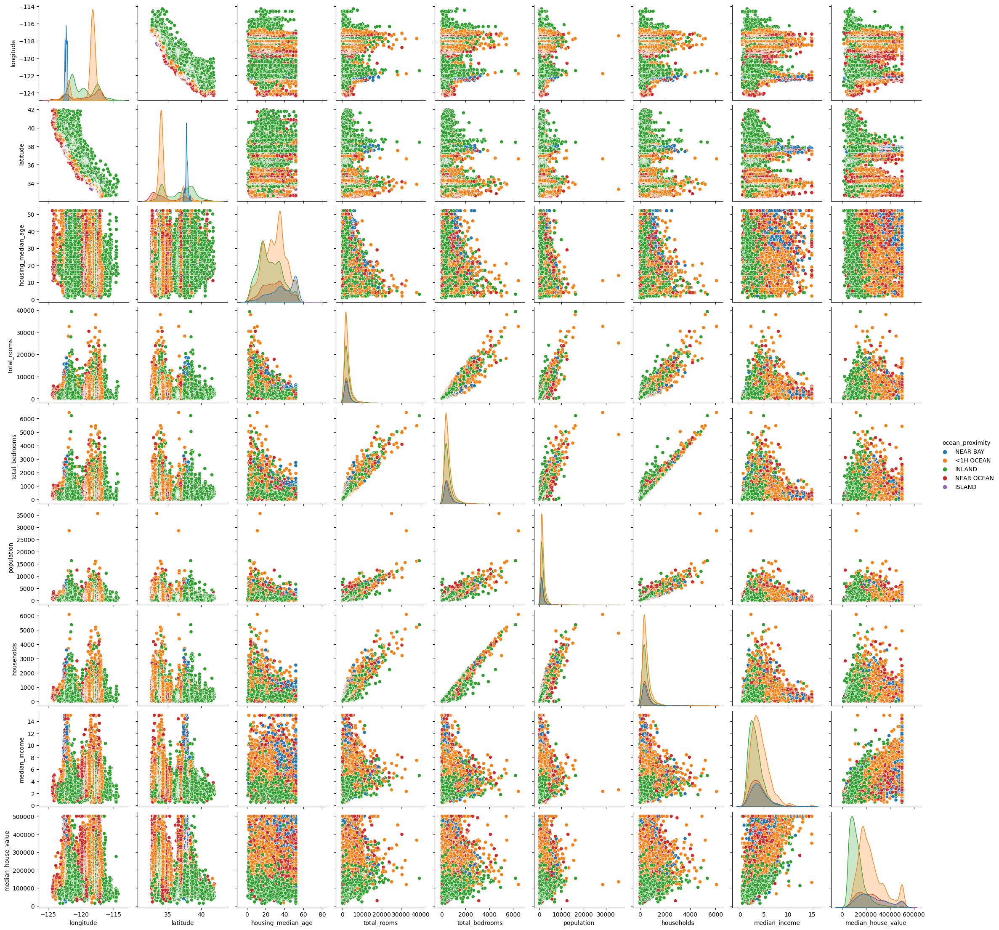

In [23]:
# Pairplot

g = sns.pairplot(data=df, hue='ocean_proximity')
# g.map_upper(sns.kdeplot, levels=4, color="tab:blue")

# Using plotly
# fig = px.scatter_matrix(df, 
#                         dimensions=df.copy().drop(columns='ocean_proximity').columns, 
#                         labels={col:col.replace('_', ' ') for col in df.columns}) # remove underscore
# fig.update_traces(marker=dict(size=1, line=dict(width=1, color="darkslategrey")))
# fig.update_traces(diagonal_visible=False)
# fig.show()

In [ ]:
# Plotar histograma do ocean proximity

### Geographical Plots

In [8]:
fig = px.scatter(df, x='longitude', y='latitude', size='population',color='median_house_value', color_continuous_scale='plasma')
fig.show()

In [9]:
fig = px.density_mapbox(df, lat='latitude', lon='longitude', z='median_house_value', radius=5,
                        hover_data=["median_income", "housing_median_age"],
                        center=dict(lat=37, lon=-120), zoom=4,
                        mapbox_style="stamen-terrain",
                        color_continuous_scale='plasma')

# fig.update_layout(
#     mapbox_style="white-bg",
#     mapbox_layers=[
#         {
#             "below": 'traces',
#             "sourcetype": "raster",
#             "sourceattribution": "United States Geological Survey",
#             "source": [
#                 "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
#             ]
#         }
#       ],
      
#     mapbox_bounds={"west": -180, "east": -50, "south": 20, "north": 90})

fig.show()

### Correlation Analysis

<Axes: >

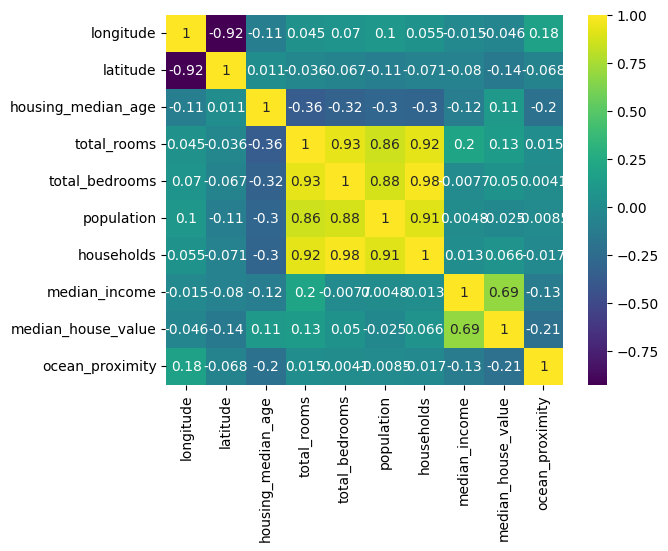

In [12]:
sns.heatmap(df.corr(), cmap='viridis',annot=True)

In [10]:
fig = px.scatter(df, x='housing_median_age', y='median_house_value', size='total_rooms', color='median_income', marginal_x="histogram", labels={col:col.replace('_', ' ') for col in df.columns}) 
fig.show()

fig = px.scatter(df, x="median_income", y="median_house_value", facet_col="ocean_proximity",labels={col:col.replace('_', ' ') for col in df.columns})
fig.update_traces(marker=dict(size=1, line=dict(width=1, color="darkslategrey")))
fig.show()

## Data Preprocessing

### Data Preparation 



In [5]:
ocean_proximity_labels = df['ocean_proximity'].unique()
print('Ocean Proximity Labels: ', ocean_proximity_labels)

# Maps the labels from ocean proximity to integers
df['ocean_proximity'] = df['ocean_proximity'].map({'NEAR BAY' : 1, '<1H OCEAN' : 2, 'INLAND' : 3, 'NEAR OCEAN' : 4, 'ISLAND' : 5}) 
df.head()

Ocean Proximity Labels:  ['NEAR BAY' '<1H OCEAN' 'INLAND' 'NEAR OCEAN' 'ISLAND']


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,1
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,1
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,1
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,1
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,1


In [6]:
target = 'median_house_value'
features = [i for i in df.columns if i not in target]

# Shuffling dataframe
df_shuffled = df.sample(frac=1, random_state=1).reset_index(drop=True)

x_train_df = df_shuffled[features]
y_train_df = df_shuffled[target]

x_train_df, x_test_df, y_train_df, y_test_df = train_test_split(x_train_df, y_train_df, test_size=0.2)

x_train_df.reset_index(drop=True,inplace=True)
y_train_df.reset_index(drop=True,inplace=True)

x_test_df.reset_index(drop=True,inplace=True)
y_test_df.reset_index(drop=True,inplace=True)

x_train_np = x_train_df.to_numpy()
y_train_np = y_train_df.to_numpy()
x_test_np= x_test_df.to_numpy()
y_test_np = y_test_df.to_numpy()
print(f'x_train shape: {x_train_np.shape} \t y_train shape: {y_train_df.shape}')

x_train shape: (16346, 9) 	 y_train shape: (16346,)


### Feature Engineering

### Feature Scalling
In order to make the training algorithm faster, we normalize the inputs using Keras Normalization layer

In [7]:
print('Before Normalization:')
print(f'Peak-to-peak x_train: {np.ptp(x_train_np, axis=0)}')
print(df[features].columns)
display(pd.DataFrame(x_train_np, columns=df[features].columns).describe())

# Creating the normalization layer
norm_1 = tf.keras.layers.Normalization(axis=-1) 
# Does the same as passing mean and variance in layer construction
norm_1.adapt(x_train_np) 

# Foward propagating x_train
x_train_norm = norm_1(x_train_np)

# Normalize testing data
norm_1.adapt(x_test_np)
x_test_norm = norm_1(x_test_np)

print('\nAfter Normalization:')
print(f'Peak-to-peak x_train: {np.ptp(x_train_norm, axis=0)}')
display(pd.DataFrame(x_train_norm, columns=df[features].columns).describe())

Before Normalization:
Peak-to-peak x_train: [1.00400e+01 9.38000e+00 5.10000e+01 3.93180e+04 6.44400e+03 2.85630e+04
 6.08100e+03 1.45002e+01 4.00000e+00]
Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'ocean_proximity'],
      dtype='object')


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
count,16346.000000,16346.000000,16346.000000,16346.000000,16346.000000,16346.000000,16346.000000,16346.000000,16346.000000
mean,-119.563330,35.626471,28.623945,2633.890371,536.869999,1423.437844,498.634345,3.877149,2.462193
std,2.003147,2.133986,12.609007,2181.184781,419.952075,1119.138166,381.686757,1.910371,0.851937
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,1.000000
25%,-121.790000,33.930000,18.000000,1446.000000,295.000000,784.000000,279.000000,2.566700,2.000000
50%,-118.490000,34.250000,29.000000,2122.000000,434.000000,1165.000000,409.000000,3.546900,2.000000
75%,-118.000000,37.720000,37.000000,3149.000000,648.000000,1721.000000,602.000000,4.744225,3.000000
max,-114.310000,41.920000,52.000000,39320.000000,6445.000000,28566.000000,6082.000000,15.000100,5.000000



After Normalization:
Peak-to-peak x_train: [ 5.0122676  4.395663   4.0448537 18.026546  15.345084  25.523111
 15.932403   7.590491   4.6953297]


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
count,16346.000000,16346.000000,1.634600e+04,1.634600e+04,1.634600e+04,1.634600e+04,1.634600e+04,16346.000000,16346.000000
mean,0.000046,-0.000009,2.651105e-07,4.403728e-07,2.982493e-07,-5.656935e-07,3.327883e-07,-0.000001,0.000002
std,1.000031,1.000031,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031,1.000031
min,-2.389601,-1.446394,-2.190878e+00,-1.206671e+00,-1.276066e+00,-1.269265e+00,-1.303817e+00,-1.767906,-1.716367
25%,-1.111574,-0.795011,-8.425938e-01,-5.446244e-01,-5.759643e-01,-5.713846e-01,-5.754482e-01,-0.685988,-0.542534
50%,0.535886,-0.645053,2.982553e-02,-2.346915e-01,-2.449638e-01,-2.309335e-01,-2.348443e-01,-0.172878,-0.542534
75%,0.780507,0.981062,6.643124e-01,2.361683e-01,2.646340e-01,2.658928e-01,2.708215e-01,0.453891,0.631298
max,2.622667,2.949269,1.853975e+00,1.681988e+01,1.406902e+01,2.425385e+01,1.462859e+01,5.822585,2.978963


### Tiling

Tile/copy our data to increase the training set size and reduce the number of training epochs.

In [8]:
x_train = np.tile(x_train_norm, (1, 1)) # Repeat 1000 times the rows while keeping the columns.
y_train = np.tile(y_train_np, (1, 1)).reshape(-1,1)

print(f'x_train shape before: {x_train_norm.shape}')
print(f'x_train shape after: {x_train.shape}')
print(y_train.shape)
print(x_train.shape)

x_train shape before: (16346, 9)
x_train shape after: (16346, 9)
(16346, 1)
(16346, 9)


## Model Training

### Deep Feed Foward Model Training

![Alt text](images/dff.png)

In [56]:
_lambda = 0.5

nn_dff = Sequential([
  InputLayer(input_shape=(x_train.shape[1],)), # This layer can be omitted 
  Dense(units=512, kernel_initializer='normal', kernel_regularizer=L2(_lambda), activation='relu', name='layer_1'),
  Dense(units=256, kernel_initializer='normal', kernel_regularizer=L2(_lambda), activation='relu', name='layer_2'),
  Dense(units=256, kernel_initializer='normal', kernel_regularizer=L2(_lambda), activation='relu', name='layer_3'),
  Dense(units=1, kernel_initializer='normal', kernel_regularizer=L2(_lambda), activation='linear', name='layer_4')
], name = 'DFF_model')

display(nn_dff.summary()) # The parameter counts correspond to the number of elements in the weight and bias.

Model: "DFF_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 512)               5120      
                                                                 
 layer_2 (Dense)             (None, 256)               131328    
                                                                 
 layer_3 (Dense)             (None, 256)               65792     
                                                                 
 layer_4 (Dense)             (None, 1)                 257       
                                                                 
Total params: 202497 (791.00 KB)
Trainable params: 202497 (791.00 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

In [57]:
# Defines loss function and optimizer
nn_dff.compile( 
    loss = 'mse', # Mean squared error
    optimizer = Adam(learning_rate=0.1),
)

# Stops training when development loss starts to increase
# Patience: number of epochs with no improvement after which the training will stop
early_stopping = EarlyStopping(monitor='val_loss', patience=10)

# Runs gradient descent and fits the weights to the data
history = nn_dff.fit(
    x_train,y_train,            
    epochs=100,
    batch_size=64,
    validation_split = 0.2,
    callbacks=[early_stopping]
)

Epoch 1/100
205/205 [==============================] - 3s 11ms/step - loss: 9735133184.0000 - val_loss: 4491639808.0000
Epoch 2/100
205/205 [==============================] - 2s 11ms/step - loss: 4974416384.0000 - val_loss: 4110604800.0000
Epoch 3/100
205/205 [==============================] - 3s 12ms/step - loss: 4486084096.0000 - val_loss: 4933605888.0000
Epoch 4/100
205/205 [==============================] - 2s 10ms/step - loss: 4256398080.0000 - val_loss: 4332924416.0000
Epoch 5/100
205/205 [==============================] - 2s 12ms/step - loss: 4038318592.0000 - val_loss: 3580002048.0000
Epoch 6/100
205/205 [==============================] - 2s 11ms/step - loss: 3972678144.0000 - val_loss: 4037746176.0000
Epoch 7/100
205/205 [==============================] - 3s 14ms/step - loss: 3796286464.0000 - val_loss: 4224947968.0000
Epoch 8/100
205/205 [==============================] - 3s 14ms/step - loss: 3621849856.0000 - val_loss: 4215464960.0000
Epoch 9/100
205/205 [===================

J_loss_min =  2383370240.0
J_cv_min =  2740959744.0


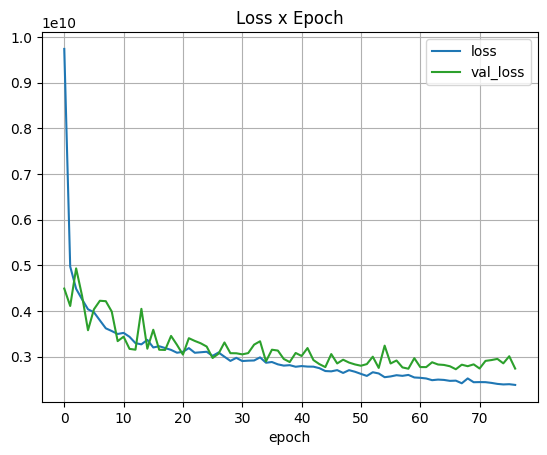

In [58]:
plt.plot(history.history['loss'], color = 'tab:blue')
plt.title('Loss x Epoch')
plt.xlabel('epoch')
# plt.xlim([0,len(history.history['loss']) - 1])

plt.plot(history.history['val_loss'], color = 'tab:green')
plt.legend(['loss', 'val_loss'])
plt.grid()

print('J_loss_min = ', history.history['loss'][-1])
print('J_cv_min = ', history.history['val_loss'][-1])

## Model Evaluation

In [59]:
p_dff = nn_dff.predict(x_test_norm)
print(nn_dff.get_layer('layer_4').get_weights()[0].shape)
print('Prediction on training set: \n', p_dff[:5,:], '\n')
print('Target values: \n', y_test_np[:5], '\n')
print('Model accuracy (delta <= 10000): %f'%(np.mean(np.abs(p_dff - y_test_np) <= 10000)))
print(f'R2 Score: {r2_score(y_test_np, p_dff)}\n')

128/128 [==============================] - 1s 4ms/step
(256, 1)
Prediction on training set: 
 [[101227.45 ]
 [203578.14 ]
 [488970.6  ]
 [100296.164]
 [237862.33 ]] 

Target values: 
 [ 84000. 265500. 494700.  81600. 218100.] 

Model accuracy (delta <= 10000): 0.059278
R2 Score: 0.7973580737254683



In [138]:
# Comparisson to linear model

model = LinearRegression()
model.fit(x_train_norm, y_train)
p_linear = model.predict(x_test_norm)

print('Prediction on training set (Linear Regression): \n', p_linear[:5,:], '\n')
print('Target values: \n', y_test_np[:5], '\n')
print('Model accuracy (delta <= 10000): %f'%(np.mean(np.abs(p_linear - y_test_np) <= 10000)))
print(f'R2 Score: {r2_score(y_test_np, p_linear)}\n')

Prediction on training set (Linear Regression): 
 [[268662.34]
 [211874.44]
 [272616.7 ]
 [186726.38]
 [200581.78]] 

Target values: 
 [263900. 247900. 325000. 181900. 288400.] 

Model accuracy (delta <= 10000): 0.057190
R2 Score: 0.6177772942640745



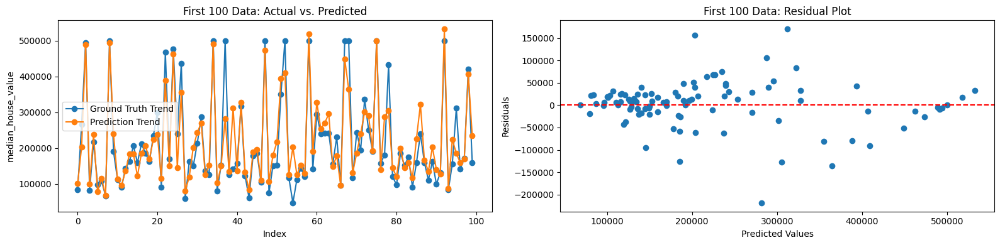

In [61]:
n_data = 100
fig, ax = plt.subplots(1,2, sharey=False, figsize=(16,4))
ax[0].plot(np.arange(len(y_test_np[:n_data])), y_test_np[:n_data], label="Ground Truth Trend", marker='o')
ax[0].plot(np.arange(len(y_test_np[:n_data])), p_dff[:n_data], label="Prediction Trend", marker='o')
ax[0].set_ylabel(target)
ax[0].set_xlabel('Index')
ax[0].set_title(f'First {n_data} Data: Actual vs. Predicted')
ax[0].legend()

residuals = p_dff[:,0] - y_test_np
ax[1].scatter(p_dff[:n_data], residuals[:n_data])
ax[1].axhline(y=0, color='r', linestyle='--')
ax[1].set_xlabel('Predicted Values')
ax[1].set_ylabel('Residuals')
ax[1].set_title(f'First {n_data} Data: Residual Plot')

plt.tight_layout()
plt.show()
